In [ ]:
# Todo: Modell für die Wahrscheinlichkeit, dass ein Pass ankommt V
# Modell/Score für die Bewertung eines Passes (angekommen, Through Ball, Packing Rate, length, ...)
# z. B. -2 für Fehlpässe, die zu einem Torschuss des Gegners führen; -1 für harmlose Fehlpässe; 0 für neutrale Pässe;
#       1 für raumgewinnende Pässe; 2 für Pässe, die zu einem Torschuss führen -> kombinieren mit dem Modell für die PG
# theoretisch auch die Erhöhung des xG-Wertes
# Zone Passing (Spielfeld in mehrere Zonen einteilen und Pass-Netzwerk erstellen) V
# Passgenauigkeit pro Spielfeldzone V
# Spielerpässe pro Zone (welcher Spieler dominiert welche Zone; Ableitung von typischen Positionen und Formationen)
# Spielerpässe pro Zone mit Einfärbung der Zone nach Passhäufigkeit und Pfeilen für die durchschnittliche Passrichtung
# Passnetzwerke mit mindestens X Pässen zwischen zwei Spielern
# Passnetzwerk nach Zonen (siehe Soccermatics S. 135)
# Identifikation von Gefahrenzonen (wo befand sich der Ball in den 10 Sekunden vor einem Tor(schuss))
# Durchschnittliche Anzahl an Pässen vor Torschüssen und Toren
# Expected Goals Chain für Spieler berechnen
# Potenzielles Passnetzwerk mit möglichen Pässen zwischen zwei Spielern

In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats.stats import pearsonr
from mplsoccer.pitch import Pitch
import os
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

C:\Users\Juhaninho\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
plt.style.use('fivethirtyeight')
params = {'axes.titlesize': 'x-large',
          'axes.labelsize': 'large', 
          'xtick.labelsize':'large',
          'ytick.labelsize':'large'}
plt.rcParams.update(params)

In [3]:
passes = pd.read_excel('extracted_data/passes.xlsx')
matches = pd.read_excel('extracted_data/matches.xlsx')
players = pd.read_excel('extracted_data/players.xlsx')

In [4]:
passes.head()

,duration,match_id,minute,period,position,second,under_pressure,recipient,length,angle,location_x,location_y,end_location_x,end_location_y,direction_x,direction_y,backheel,deflected,miscommunication,cross,cut_back,switch,shot_assist,goal_assist,team_id,player_id,ground_pass,low_pass,high_pass,drop_kick,head,keeper_arm,left_foot,right_foot,no_touch,corner,free_kick,goal_kick,interception,kick_off,recovery,throw_in,incomplete,injury_clearance,out,pass_offside,complete,inswinging,outswinging,straight,through_ball,pred_accuracy
0,0.806,9592,0,1,24,7,0,5203,13.000000,3.141593,61.0,41.0,48.0,41.0,-13.0,0.0,0,0,0,0,0,0,0,0,217,5246,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0.990284
1,1.849,9592,0,1,11,9,0,6374,26.476404,1.380808,50.0,47.0,55.0,73.0,5.0,26.0,0,0,0,0,0,0,0,0,217,5203,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.983590
2,1.036,9592,0,1,2,13,0,5470,15.000000,-2.214297,60.0,73.0,51.0,61.0,-9.0,-12.0,0,0,0,0,0,0,0,0,217,6374,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.988724
3,1.237,9592,0,1,9,15,0,5213,19.723083,-2.102520,51.0,61.0,41.0,44.0,-10.0,-17.0,0,0,0,0,0,0,0,0,217,5470,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.991368
4,1.941,9592,0,1,3,18,0,5492,22.203604,-1.435269,42.0,39.0,45.0,17.0,3.0,-22.0,0,0,0,0,0,0,0,0,217,5213,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.975176


In [5]:
print('Pässe: ' + str(len(passes)))
print('Angekommene Pässe: ' + str(passes['complete'].sum()))
print('Passquote: ' + str(np.round(100 * passes['complete'].mean(), 2)) + '%')
print('Erwartete Passquote: ' + str(np.round(100 * passes['pred_accuracy'].mean(), 2)) + '%')

Pässe: 506317
Angekommene Pässe: 414517
Passquote: 81.87%
Erwartete Passquote: 81.81%


In [261]:
def bar_plot(feature):
    fig = plt.figure(figsize=(7,4))
    ax = fig.add_axes([0,0,1,1])
    nums = [passes.loc[passes[feature] == x, 'pred_accuracy'].mean() for x in passes[feature].unique()]
    ax.bar(x=passes[feature].unique(), height=nums)
    plt.xticks(passes[feature].unique())
    plt.title('Passgenauigkeit in Abhängigkeit von ' + feature)
    plt.ylabel('Passgenauigkeit')
    plt.xlabel(feature)
    plt.show()

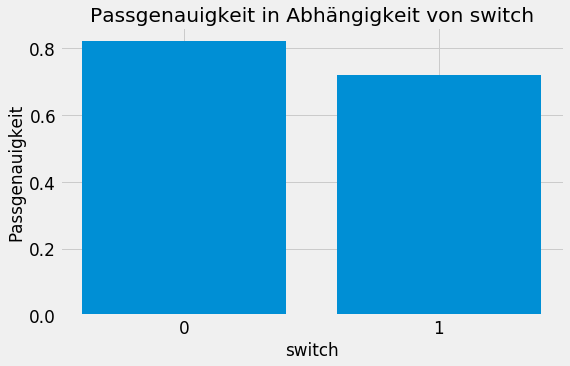

In [51]:
bar_plot('switch')

In [259]:
len(passes[(passes['deflected'] == 1)])

570

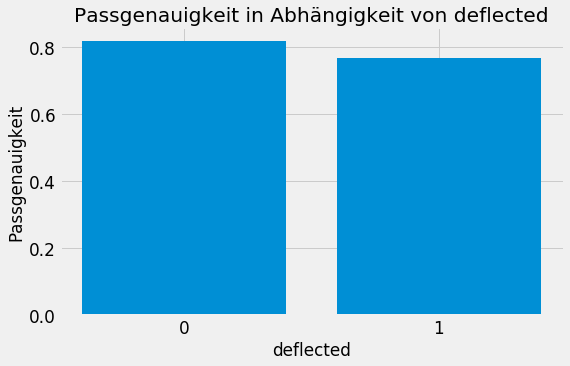

In [82]:
bar_plot('deflected')

In [7]:
def box_plot(feature, limit=25000):
    fig = plt.figure(figsize=(7,4))
    ax = fig.add_axes([0,0,1,1])
    passes_limit = passes[:limit]
    nums = [passes_limit.loc[passes_limit['complete'] == 0, feature] for x in passes_limit[feature].unique()]
    ax.boxplot([passes_limit.loc[passes_limit['complete'] == 0, feature], passes_limit.loc[passes_limit['complete'] == 1, feature]], labels=['Nicht Angekommen', 'Angekommen'])
    plt.title(feature + ' in Abhängigkeit von der Passquote')
    plt.ylabel(feature)
    plt.show()

C:\Users\Juhaninho\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


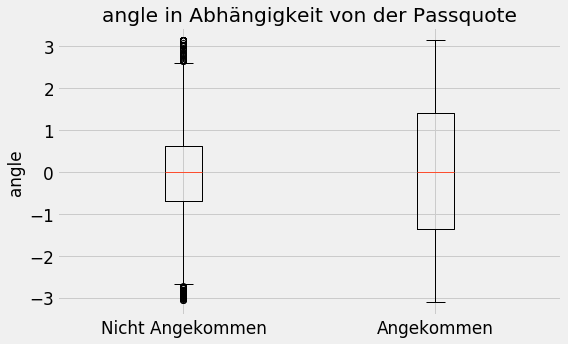

In [8]:
box_plot('angle')

C:\Users\Juhaninho\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


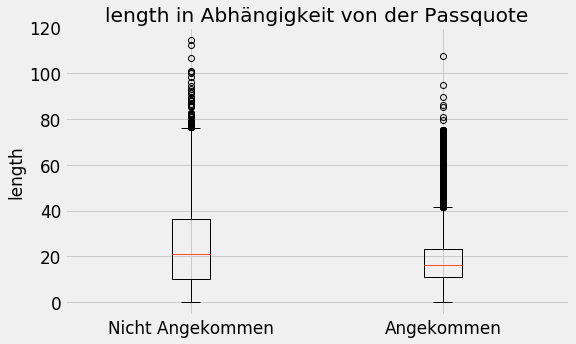

In [13]:
box_plot('length')

C:\Users\Juhaninho\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


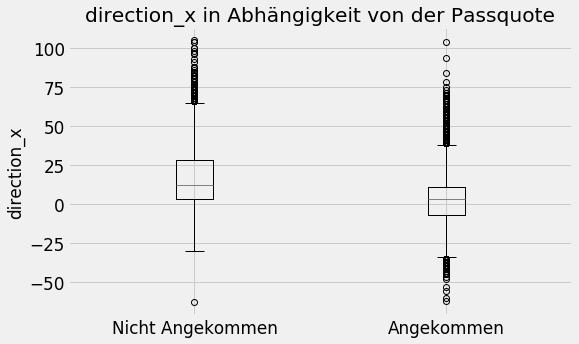

In [9]:
box_plot('direction_x')

In [6]:
passes['match_id'].unique()[0]

9592

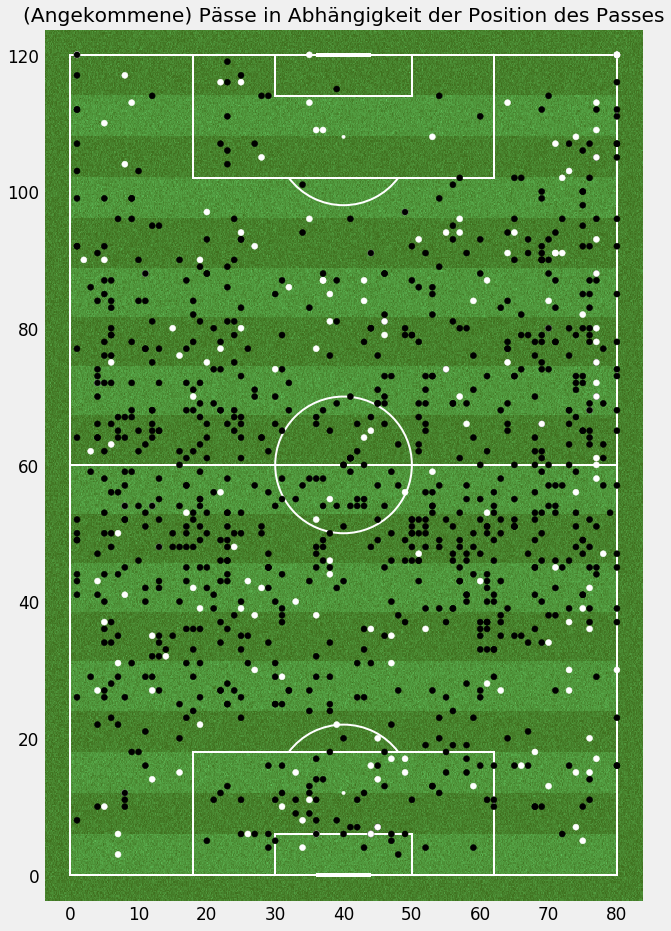

In [11]:
match_passes = passes[passes['match_id'] == 9592]
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.scatter(match_passes['location_y'], match_passes['location_x'], c=match_passes['complete'], cmap='binary')
plt.title('(Angekommene) Pässe in Abhängigkeit der Position des Passes')
plt.show()

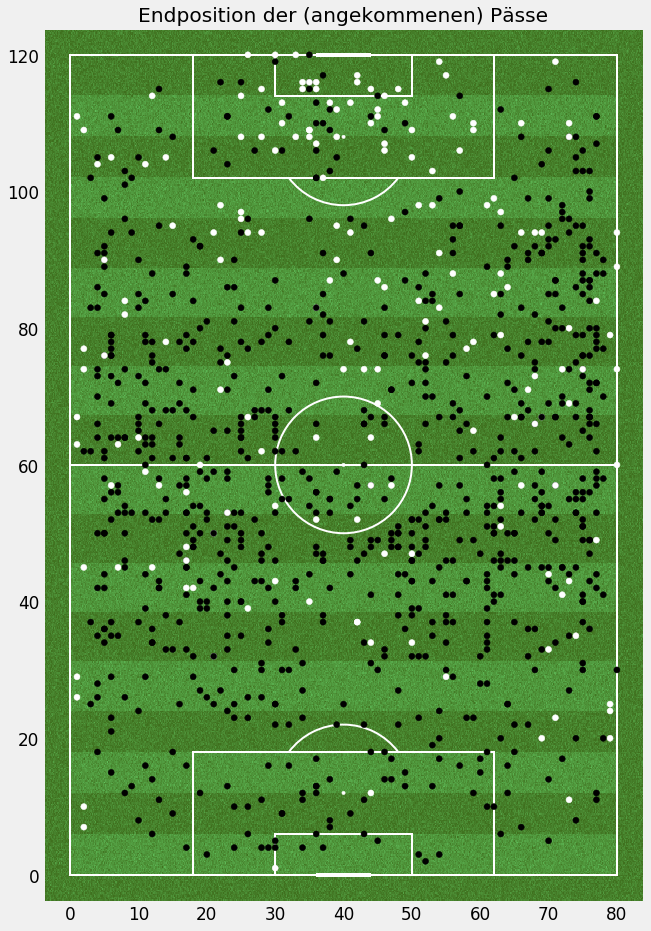

In [12]:
match_passes = passes[passes['match_id'] == 9592]
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.scatter(match_passes['end_location_y'], match_passes['end_location_x'], c=match_passes['complete'], cmap='binary')
plt.title('Endposition der (angekommenen) Pässe')
plt.show()

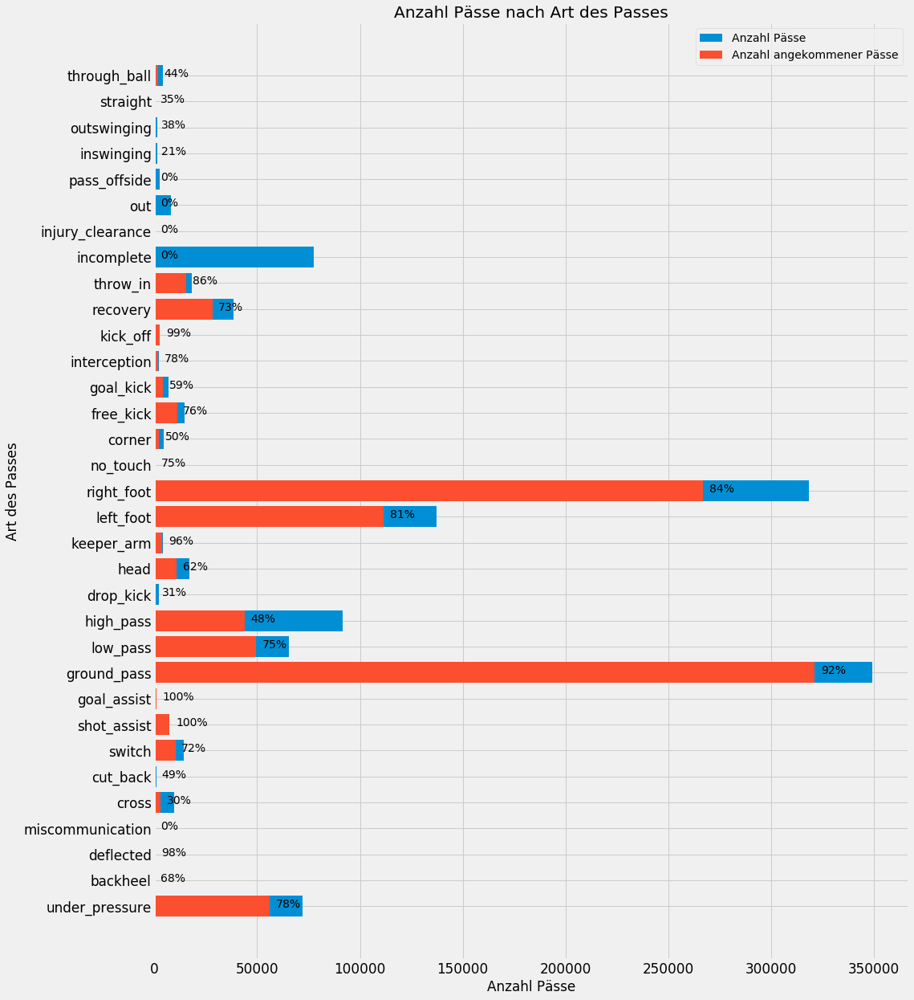

In [19]:
# (Angekommene) Pässe in Abhängigkeit der Art des Passes
situations = ['under_pressure', 'backheel', 'deflected', 'miscommunication', 'cross',
              'cut_back', 'switch', 'shot_assist', 'goal_assist', 'ground_pass', 'low_pass',
              'high_pass', 'drop_kick', 'head', 'keeper_arm', 'left_foot',
              'right_foot', 'no_touch', 'corner', 'free_kick', 'goal_kick',
              'interception', 'kick_off', 'recovery', 'throw_in', 'incomplete',
              'injury_clearance', 'out', 'pass_offside', 'inswinging',
              'outswinging', 'straight', 'through_ball']
completed_passes = passes[passes['complete'] == 1]
num_passes = [len(passes[passes[situation] == 1]) for situation in situations]
num_completed_passes = [len(completed_passes[completed_passes[situation] == 1]) for situation in situations]
pct_completed = [int(np.round(100 * len(completed_passes[completed_passes[situation] == 1]) / len(passes[passes[situation] == 1]))) for situation in situations]
plt.figure(figsize=(15,20))
plt.barh(y=situations, width=num_passes, label='Anzahl Pässe')
plt.barh(y=situations, width=num_completed_passes, label='Anzahl angekommener Pässe')
for i in range(len(situations)):
    plt.text(num_completed_passes[i] + 3000, i - 0.05, str(pct_completed[i]) + '%')
plt.title('Anzahl Pässe nach Art des Passes')
plt.xlabel('Anzahl Pässe')
plt.ylabel('Art des Passes')
plt.legend()
plt.show()

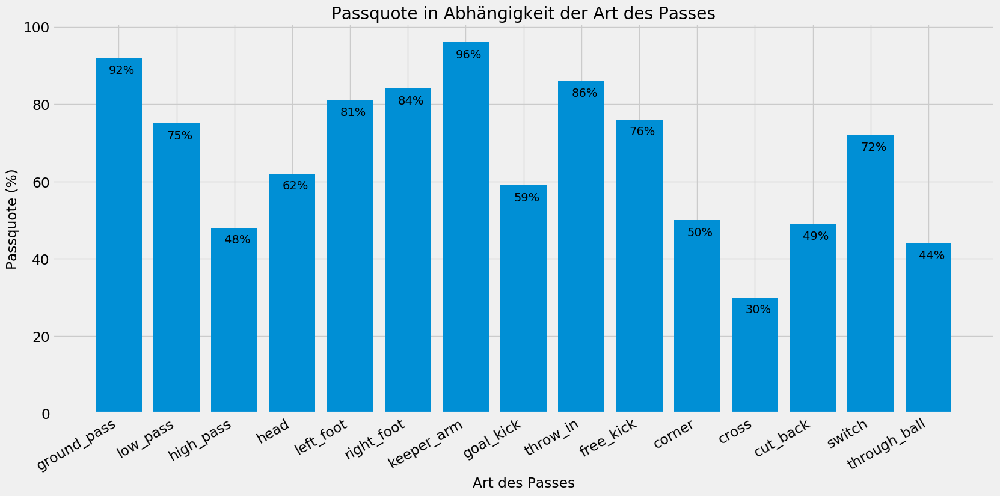

In [379]:
# Passquote in Abhängigkeit der Art des Passes
situations = ['ground_pass', 'low_pass', 'high_pass', 'head', 'left_foot', 'right_foot', 'keeper_arm', 'goal_kick', 
              'throw_in', 'free_kick', 'corner', 'cross', 'cut_back', 'switch', 'through_ball']
completed_passes = passes[passes['complete'] == 1]
pct_completed = [int(np.round(100 * len(completed_passes[completed_passes[situation] == 1]) / len(passes[passes[situation] == 1]))) for situation in situations]
plt.figure(figsize=(18,8))
plt.bar(x=situations, height=pct_completed)
for i in range(len(situations)):
    plt.text(i - 0.17, pct_completed[i] - 4, str(pct_completed[i]) + '%')
plt.xticks(rotation=30, ha='right')
plt.title('Passquote in Abhängigkeit der Art des Passes')
plt.xlabel('Art des Passes')
plt.ylabel('Passquote (%)')
plt.show()

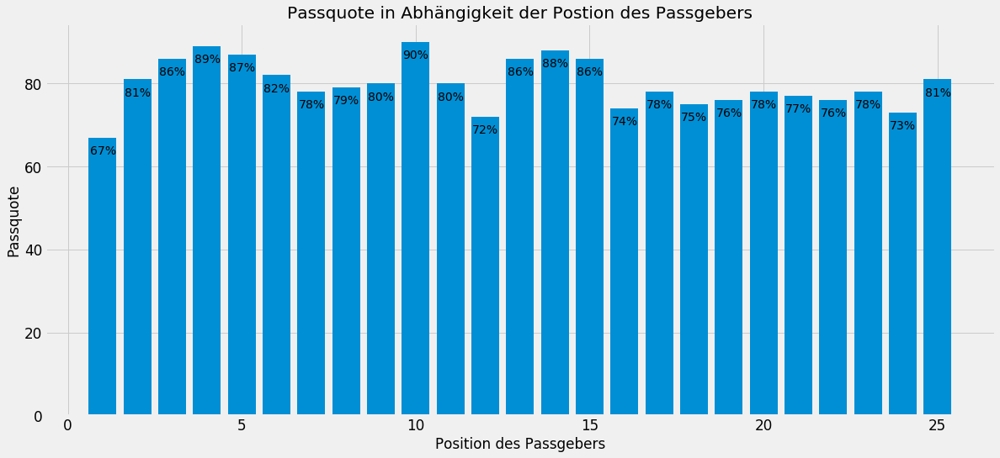

In [30]:
# Passquote in Abhängigkeit der Position des Spielers
positions = np.sort(passes['position'].unique())
completed_passes = passes[passes['complete'] == 1]
pct_completed = [int(np.round(100 * len(completed_passes[completed_passes['position'] == position]) / len(passes[passes['position'] == position]))) for position in positions]
plt.figure(figsize=(18,8))
plt.bar(x=positions, height=pct_completed)
for i in range(len(positions)):
    plt.text(i + 0.63, pct_completed[i] - 4, str(pct_completed[i]) + '%')
plt.title('Passquote in Abhängigkeit der Postion des Passgebers')
plt.xlabel('Position des Passgebers')
plt.ylabel('Passquote')
plt.show()

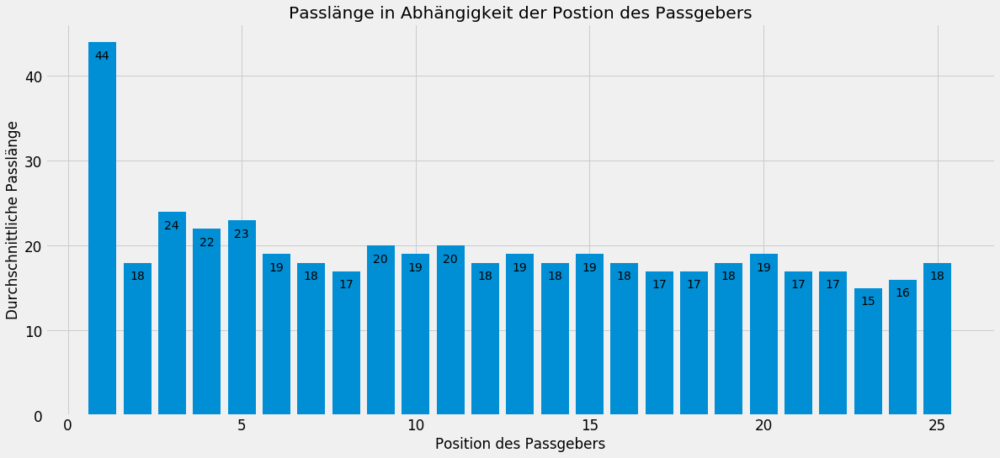

In [33]:
# Passlänge in Abhängigkeit der Position des Spielers
positions = np.sort(passes['position'].unique())
pass_lengths = [round(passes.loc[passes['position'] == position, 'length'].mean()) for position in positions]
plt.figure(figsize=(18,8))
plt.bar(x=positions, height=pass_lengths)
for i in range(len(positions)):
    plt.text(i + 0.78, pass_lengths[i] - 2, str(pass_lengths[i]))
plt.title('Passlänge in Abhängigkeit der Postion des Passgebers')
plt.xlabel('Position des Passgebers')
plt.ylabel('Durchschnittliche Passlänge')
plt.show()

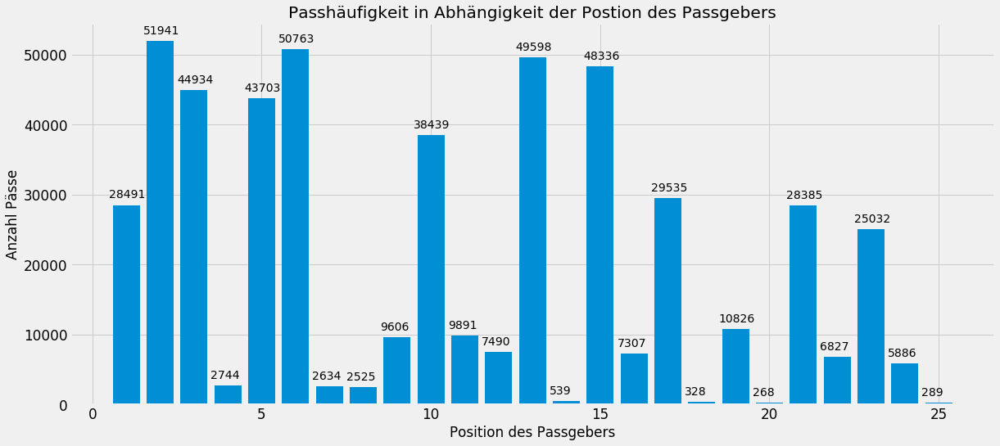

In [35]:
# Passhäufigkeit in Abhängigkeit der Position des Spielers
positions = np.sort(passes['position'].unique())
num_passes = [len(passes[passes['position'] == position]) for position in positions]
plt.figure(figsize=(18,8))
plt.bar(x=positions, height=num_passes)
for i in range(len(positions)):
    plt.text(i + 0.5, num_passes[i] + 1000, str(num_passes[i]))
plt.title('Passhäufigkeit in Abhängigkeit der Postion des Passgebers')
plt.xlabel('Position des Passgebers')
plt.ylabel('Anzahl Pässe')
plt.show()

In [573]:
# Vergleich der Passquote eines Spielers in einem Spiel mit der erwarteten Passquote
def evaluate_pass_accuracy(player_id, match_id=None, print_values=True):
    if match_id != None:
        the_passes = passes[(passes['match_id'] == match_id) & (passes['player_id'] == player_id)]
    else:
        the_passes = passes[passes['player_id'] == player_id]
    pass_accuracy = np.round(100 * len(the_passes[the_passes['complete'] == 1]) / len(the_passes), 2)
    expected_accuracy = np.round(100 * sum(the_passes['pred_accuracy']) / len(the_passes), 2)
    if print_values:
        print('Passquote: ' + str(pass_accuracy) + '%')
        print('Erwartete Passquote: ' + str(expected_accuracy) + '%')
    else:
        return pass_accuracy, expected_accuracy

In [4]:
def get_player_name(player_id):
    if pd.notna(players.loc[players['player_id'] == player_id, 'player_nickname'].iloc[0]):
        return players.loc[players['player_id'] == player_id, 'player_nickname'].iloc[0]
    else:
        return players.loc[players['player_id'] == player_id, 'player_name'].iloc[0]

In [668]:
# Alle Pässe eines Spielers in einem Spiel
def plot_player_passes(match_id, player_id):
    pitch = Pitch(figsize=(15,18), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='horizontal', tight_layout=False)
    fig, ax = pitch.draw()
    the_passes = passes[(passes['match_id'] == match_id) & (passes['player_id'] == player_id)]
    for idx, thepass in the_passes.iterrows():
        x = thepass['location_x']
        y = thepass['location_y']
        passCircle = plt.Circle((x, y), 2, color="blue")      
        passCircle.set_alpha(.2)   
        ax.add_patch(passCircle)
        dx = thepass['end_location_x']-x
        dy = thepass['end_location_y']-y
        arrow_color = 'blue' if thepass['complete'] == 1 else 'red'
        passArrow = plt.Arrow(x, y, dx, dy, width=3, color=arrow_color)
        ax.add_patch(passArrow)

    match = matches[matches['match_id'] == match_id].iloc[0]
    player = players[players['player_id'] == player_id].iloc[0]
    pass_accuracy, expected_accuracy = evaluate_pass_accuracy(player_id, match_id, print_values=False)
    plt.text(4, 82.5, str(len(the_passes)) + ' Pässe' + '   ' + str(pass_accuracy) + '% Passgenauigkeit   ' 
                    + str(expected_accuracy) + '% Erwartete Passgenauigkeit', color='black')
    plt.text(4, -1.5, 'Blau: Angekommene Pässe   Rot: Fehlpässe', color='black')
    plt.title(match['home_team_name'] + ' gegen ' + match['away_team_name'] + ' ' + str(match['home_score']) + '-' + str(match['away_score']) + ': Pässe von ' + get_player_name(player_id))
    plt.show()

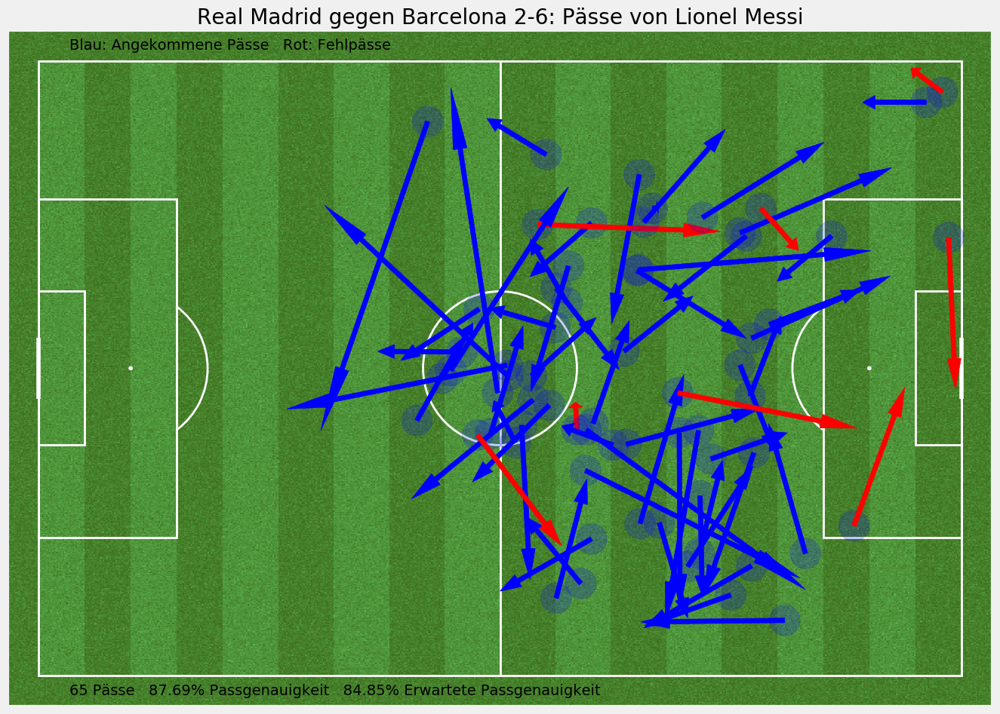

In [669]:
plot_player_passes(69249, 5503)

In [41]:
match_id = 9592
player_id = 5503
evaluate_pass_accuracy(player_id, match_id)

Passquote: 78.69%
Erwartete Passquote: 76.05%


In [42]:
shot_assists = passes[passes['shot_assist'] == 1]
goal_assists = passes[passes['goal_assist'] == 1]
assists = pd.concat([shot_assists, goal_assists])

In [43]:
len(shot_assists)

7455

In [44]:
len(goal_assists)

1118

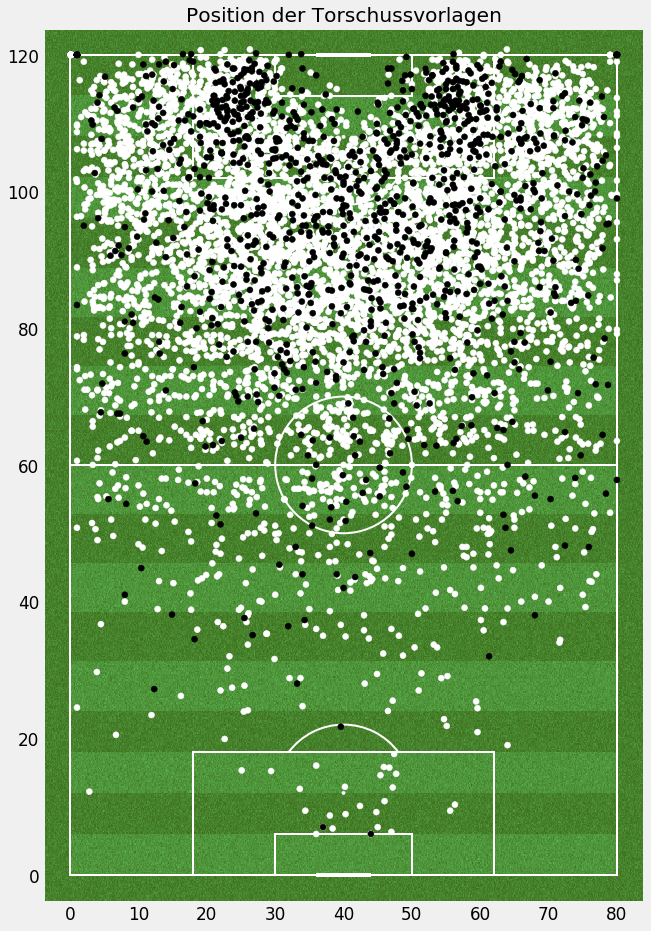

In [45]:
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.scatter(assists['location_y'], assists['location_x'], c=assists['goal_assist'], cmap='binary')
plt.title('Position der Torschussvorlagen')
plt.show()

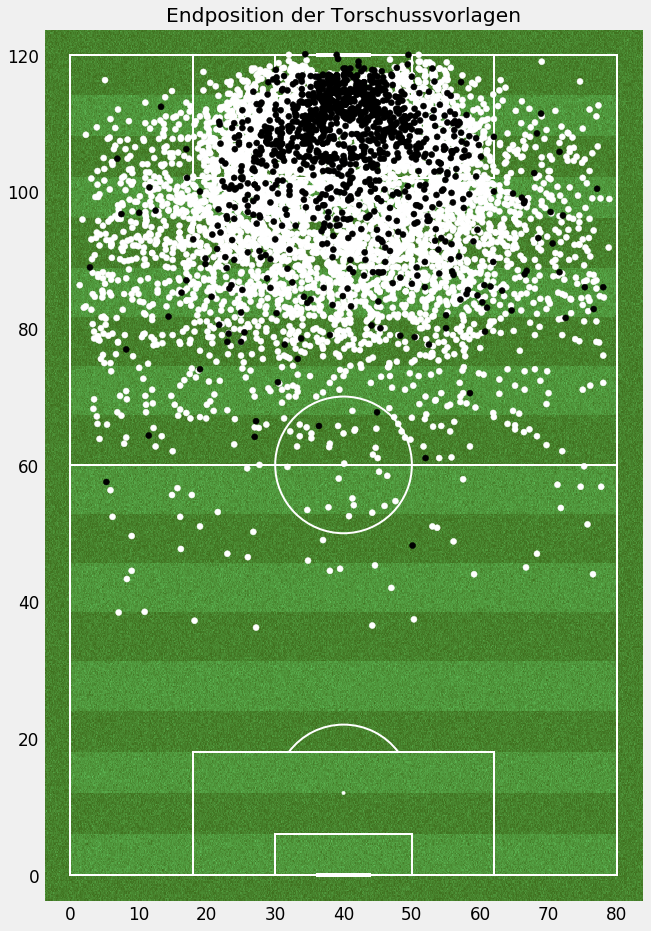

In [46]:
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.scatter(assists['end_location_y'], assists['end_location_x'], c=assists['goal_assist'], cmap='binary')
plt.title('Endposition der Torschussvorlagen')
plt.show()

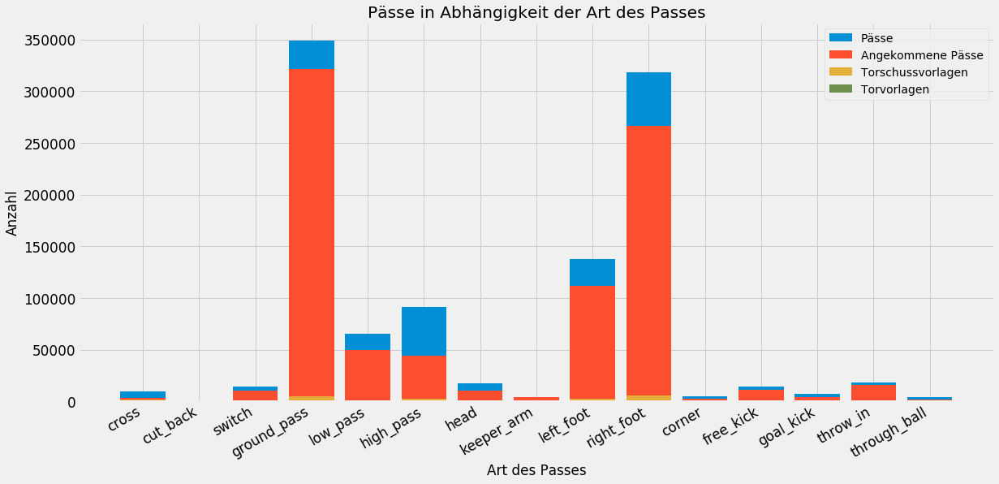

In [48]:
# Passquote in Abhängigkeit der Art des Passes
situations = ['cross', 'cut_back', 'switch', 'ground_pass', 'low_pass', 'high_pass', 'head', 'keeper_arm', 'left_foot',
              'right_foot', 'corner', 'free_kick', 'goal_kick', 'throw_in', 'through_ball']
all_passes = [len(passes[passes[situation] == 1]) for situation in situations]
completed_passes = [len(passes[(passes['complete'] == 1) & (passes[situation] == 1)]) for situation in situations]
shot_passes = [len(passes[((passes['shot_assist'] == 1) | (passes['goal_assist'] == 1)) & (passes[situation] == 1)]) for situation in situations]
goal_passes = [len(passes[(passes['goal_assist'] == 1) & (passes[situation] == 1)]) for situation in situations]
plt.figure(figsize=(18,8))
plt.bar(x=situations, height=all_passes, label='Pässe')
plt.bar(x=situations, height=completed_passes, label='Angekommene Pässe')
plt.bar(x=situations, height=shot_passes, label='Torschussvorlagen')
plt.bar(x=situations, height=goal_passes, label='Torvorlagen')
plt.xticks(rotation=30, ha='right')
plt.title('Pässe in Abhängigkeit der Art des Passes')
plt.xlabel('Art des Passes')
plt.ylabel('Anzahl')
plt.legend()
plt.show()

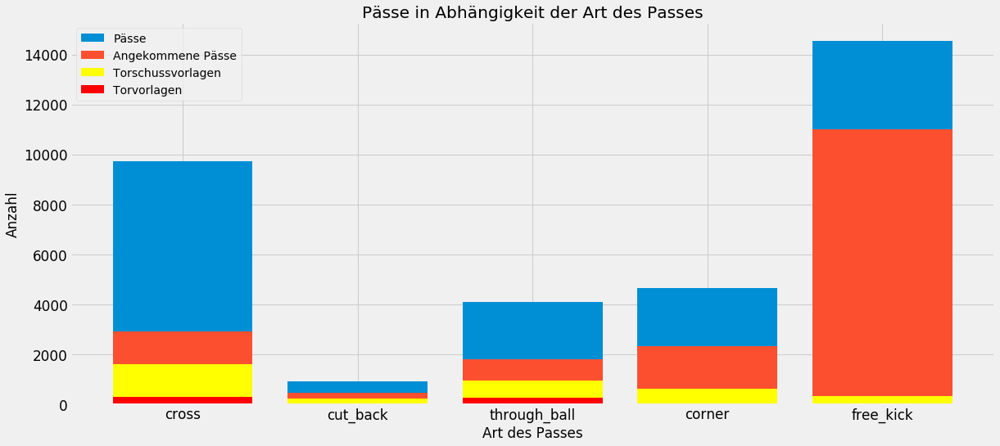

In [49]:
# Passquote in Abhängigkeit der Art des Passes
situations = ['cross', 'cut_back', 'through_ball', 'corner', 'free_kick']
all_passes = [len(passes[passes[situation] == 1]) for situation in situations]
completed_passes = [len(passes[(passes['complete'] == 1) & (passes[situation] == 1)]) for situation in situations]
shot_passes = [len(passes[((passes['shot_assist'] == 1) | (passes['goal_assist'] == 1)) & (passes[situation] == 1)]) for situation in situations]
goal_passes = [len(passes[(passes['goal_assist'] == 1) & (passes[situation] == 1)]) for situation in situations]
plt.figure(figsize=(18,8))
plt.bar(x=situations, height=all_passes, label='Pässe')
plt.bar(x=situations, height=completed_passes, label='Angekommene Pässe')
plt.bar(x=situations, height=shot_passes, label='Torschussvorlagen', color='yellow')
plt.bar(x=situations, height=goal_passes, label='Torvorlagen', color='red')
plt.title('Pässe in Abhängigkeit der Art des Passes')
plt.xlabel('Art des Passes')
plt.ylabel('Anzahl')
plt.legend()
plt.show()

Analyse der Passquote in Abhängigkeit der Spielfeldzone

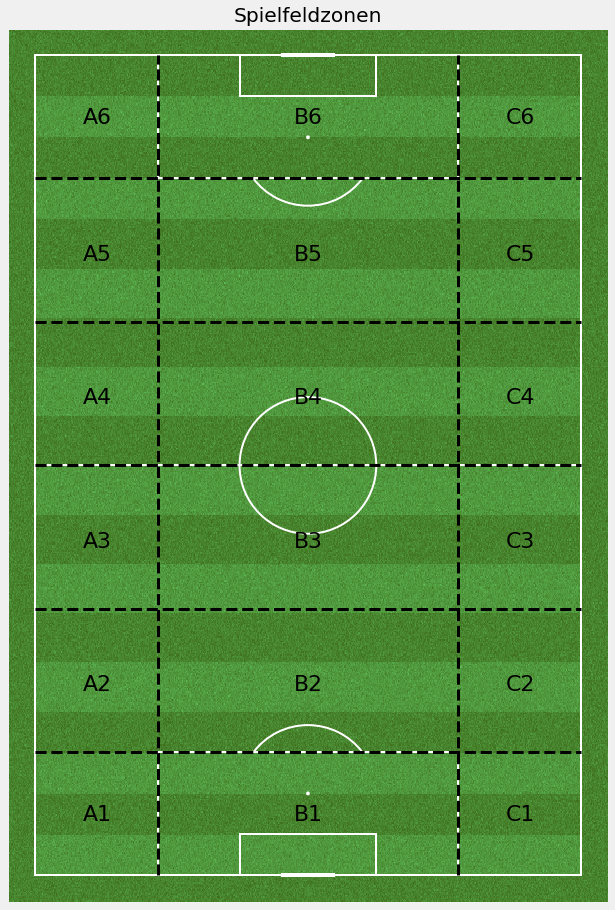

In [56]:
# Diagramm zu den Spielfeldzonen
pitch = Pitch(figsize=(15,15), pitch_color='grass', line_color='white', stripe=True, axis=True, 
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.vlines(18,0,120, linestyle='--', linewidth=3)
ax.vlines(62,0,120, linestyle='--', linewidth=3)
ax.hlines(18,0,80, linestyle='--', linewidth=3)
ax.hlines(39,0,80, linestyle='--', linewidth=3)
ax.hlines(60,0,80, linestyle='--', linewidth=3)
ax.hlines(81,0,80, linestyle='--', linewidth=3)
ax.hlines(102,0,80, linestyle='--', linewidth=3)
ax.text(7,8,'A1',color='k',fontsize=22)
ax.text(38,8,'B1',color='k',fontsize=22)
ax.text(69,8,'C1',color='k',fontsize=22)
ax.text(7,27,'A2',color='k',fontsize=22)
ax.text(38,27,'B2',color='k',fontsize=22)
ax.text(69,27,'C2',color='k',fontsize=22)
ax.text(7,48,'A3',color='k',fontsize=22)
ax.text(38,48,'B3',color='k',fontsize=22)
ax.text(69,48,'C3',color='k',fontsize=22)
ax.text(7,69,'A4',color='k',fontsize=22)
ax.text(38,69,'B4',color='k',fontsize=22)
ax.text(69,69,'C4',color='k',fontsize=22)
ax.text(7,90,'A5',color='k',fontsize=22)
ax.text(38,90,'B5',color='k',fontsize=22)
ax.text(69,90,'C5',color='k',fontsize=22)
ax.text(7,110,'A6',color='k',fontsize=22)
ax.text(38,110,'B6',color='k',fontsize=22)
ax.text(69,110,'C6',color='k',fontsize=22)
plt.title('Spielfeldzonen')
plt.show()

In [607]:
def get_zone(location_x, location_y):
    if (location_x < 18) & (location_y < 18):
        return 'A1'
    if (location_x < 18) & (18 <= location_y <= 62):
        return 'B1'
    if (location_x < 18) & (location_y > 62):
        return 'C1'
    if (18 <= location_x < 39) & (location_y < 18):
        return 'A2'
    if (18 <= location_x < 39) & (18 <= location_y <= 62):
        return 'B2'
    if (18 <= location_x < 39) & (location_y > 62):
        return 'C2'
    if (39 <= location_x < 60) & (location_y < 18):
        return 'A3'
    if (39 <= location_x < 60) & (18 <= location_y <= 62):
        return 'B3'
    if (39 <= location_x < 60) & (location_y > 62):
        return 'C3'
    if (60 <= location_x < 81) & (location_y < 18):
        return 'A4'
    if (60 <= location_x < 81) & (18 <= location_y <= 62):
        return 'B4'
    if (60 <= location_x < 81) & (location_y > 62):
        return 'C4'
    if (81 <= location_x < 102) & (location_y < 18):
        return 'A5'
    if (81 <= location_x < 102) & (18 <= location_y <= 62):
        return 'B5'
    if (81 <= location_x < 102) & (location_y > 62):
        return 'C5'
    if (location_x >= 102) & (location_y < 18):
        return 'A6'
    if (location_x >= 102) & (18 <= location_y <= 62):
        return 'B6'
    if (location_x >= 102) & (location_y > 62):
        return 'C6'
    return -1

In [608]:
passes.loc[:, 'from_zone'] = [get_zone(passes['location_x'].iloc[i], passes['location_y'].iloc[i]) for i in range(len(passes))]
passes.loc[:, 'to_zone'] = [get_zone(passes['end_location_x'].iloc[i], passes['end_location_y'].iloc[i]) for i in range(len(passes))]

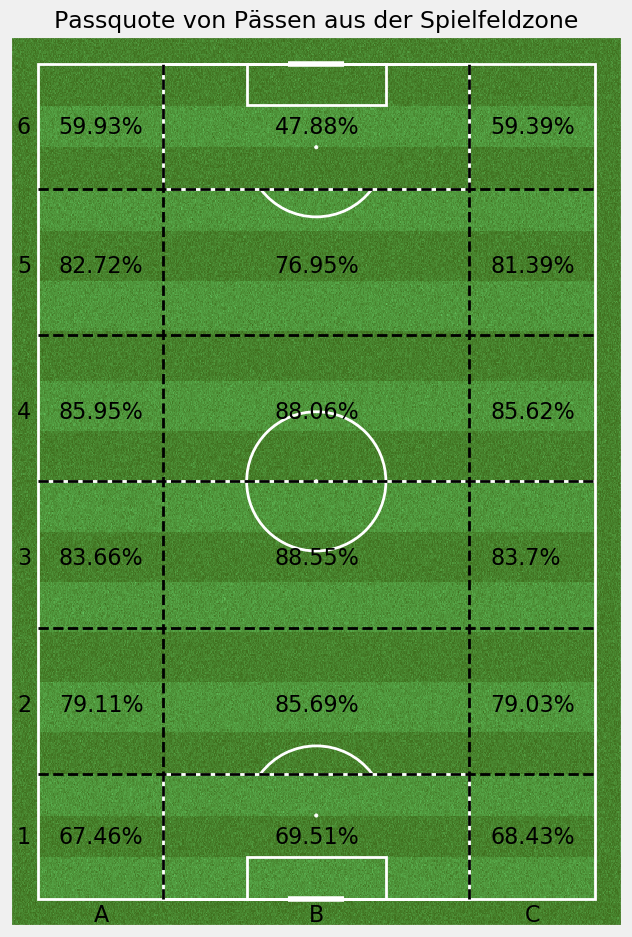

In [610]:
# Diagramm zu den Spielfeldzonen
pitch = Pitch(figsize=(11,11), pitch_color='grass', line_color='white', stripe=True, axis=True, 
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.vlines(18,0,120, linestyle='--', linewidth=2)
ax.vlines(62,0,120, linestyle='--', linewidth=2)
ax.hlines(18,0,80, linestyle='--', linewidth=2)
ax.hlines(39,0,80, linestyle='--', linewidth=2)
ax.hlines(60,0,80, linestyle='--', linewidth=2)
ax.hlines(81,0,80, linestyle='--', linewidth=2)
ax.hlines(102,0,80, linestyle='--', linewidth=2)
ax.text(8,-3.3,'A',fontsize=16)
ax.text(39,-3.3,'B',fontsize=16)
ax.text(70,-3.3,'C',fontsize=16)
ax.text(-3,8,'1',fontsize=16)
ax.text(-3,27,'2',fontsize=16)
ax.text(-3,48,'3',fontsize=16)
ax.text(-3,69,'4',fontsize=16)
ax.text(-3,90,'5',fontsize=16)
ax.text(-3,110,'6',fontsize=16)
#,bbox=dict(facecolor='w',boxstyle='round',alpha=0.7)
ax.text(3,8,str(np.round(100 * passes.loc[passes['from_zone'] == 'A1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,8,str(np.round(100 * passes.loc[passes['from_zone'] == 'B1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,8,str(np.round(100 * passes.loc[passes['from_zone'] == 'C1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,27,str(np.round(100 * passes.loc[passes['from_zone'] == 'A2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,27,str(np.round(100 * passes.loc[passes['from_zone'] == 'B2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,27,str(np.round(100 * passes.loc[passes['from_zone'] == 'C2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,48,str(np.round(100 * passes.loc[passes['from_zone'] == 'A3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,48,str(np.round(100 * passes.loc[passes['from_zone'] == 'B3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,48,str(np.round(100 * passes.loc[passes['from_zone'] == 'C3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,69,str(np.round(100 * passes.loc[passes['from_zone'] == 'A4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,69,str(np.round(100 * passes.loc[passes['from_zone'] == 'B4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,69,str(np.round(100 * passes.loc[passes['from_zone'] == 'C4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,90,str(np.round(100 * passes.loc[passes['from_zone'] == 'A5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,90,str(np.round(100 * passes.loc[passes['from_zone'] == 'B5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,90,str(np.round(100 * passes.loc[passes['from_zone'] == 'C5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,110,str(np.round(100 * passes.loc[passes['from_zone'] == 'A6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,110,str(np.round(100 * passes.loc[passes['from_zone'] == 'B6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,110,str(np.round(100 * passes.loc[passes['from_zone'] == 'C6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
plt.title('Passquote von Pässen aus der Spielfeldzone', fontsize=17)
plt.show()

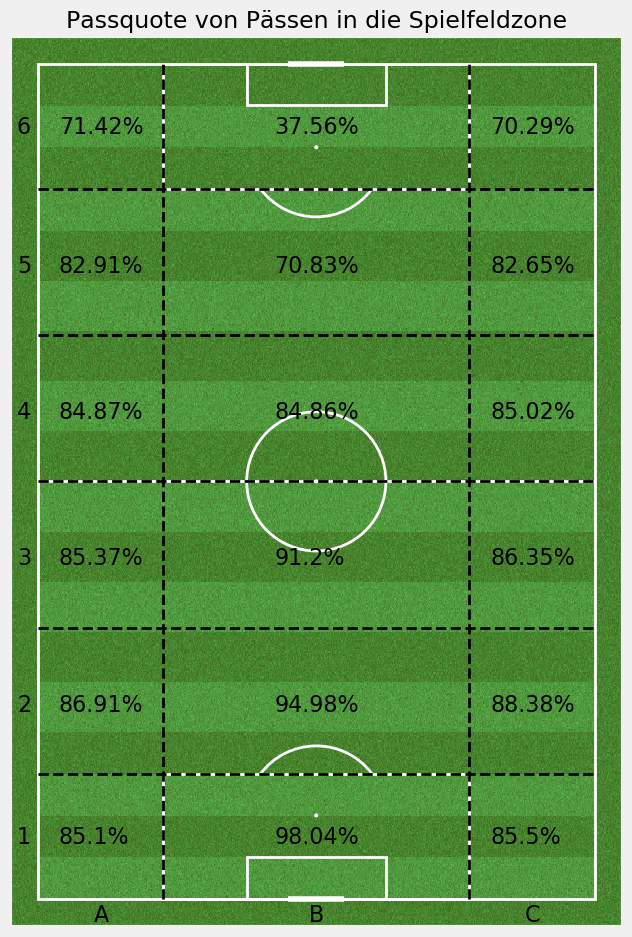

In [358]:
# Diagramm zu den Spielfeldzonen
pitch = Pitch(figsize=(11,11), pitch_color='grass', line_color='white', stripe=True, axis=True, 
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.vlines(18,0,120, linestyle='--', linewidth=2)
ax.vlines(62,0,120, linestyle='--', linewidth=2)
ax.hlines(18,0,80, linestyle='--', linewidth=2)
ax.hlines(39,0,80, linestyle='--', linewidth=2)
ax.hlines(60,0,80, linestyle='--', linewidth=2)
ax.hlines(81,0,80, linestyle='--', linewidth=2)
ax.hlines(102,0,80, linestyle='--', linewidth=2)
ax.text(8,-3.3,'A',fontsize=16)
ax.text(39,-3.3,'B',fontsize=16)
ax.text(70,-3.3,'C',fontsize=16)
ax.text(-3,8,'1',fontsize=16)
ax.text(-3,27,'2',fontsize=16)
ax.text(-3,48,'3',fontsize=16)
ax.text(-3,69,'4',fontsize=16)
ax.text(-3,90,'5',fontsize=16)
ax.text(-3,110,'6',fontsize=16)
ax.text(3,8,str(np.round(100 * passes.loc[passes['to_zone'] == 'A1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,8,str(np.round(100 * passes.loc[passes['to_zone'] == 'B1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,8,str(np.round(100 * passes.loc[passes['to_zone'] == 'C1', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,27,str(np.round(100 * passes.loc[passes['to_zone'] == 'A2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,27,str(np.round(100 * passes.loc[passes['to_zone'] == 'B2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,27,str(np.round(100 * passes.loc[passes['to_zone'] == 'C2', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,48,str(np.round(100 * passes.loc[passes['to_zone'] == 'A3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,48,str(np.round(100 * passes.loc[passes['to_zone'] == 'B3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,48,str(np.round(100 * passes.loc[passes['to_zone'] == 'C3', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,69,str(np.round(100 * passes.loc[passes['to_zone'] == 'A4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,69,str(np.round(100 * passes.loc[passes['to_zone'] == 'B4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,69,str(np.round(100 * passes.loc[passes['to_zone'] == 'C4', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,90,str(np.round(100 * passes.loc[passes['to_zone'] == 'A5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,90,str(np.round(100 * passes.loc[passes['to_zone'] == 'B5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,90,str(np.round(100 * passes.loc[passes['to_zone'] == 'C5', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(3,110,str(np.round(100 * passes.loc[passes['to_zone'] == 'A6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(34,110,str(np.round(100 * passes.loc[passes['to_zone'] == 'B6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
ax.text(65,110,str(np.round(100 * passes.loc[passes['to_zone'] == 'C6', 'complete'].mean(), 2)) + '%',color='k',fontsize=16)
plt.title('Passquote von Pässen in die Spielfeldzone', fontsize=17)
plt.show()

In [ ]:
# Anzahl der Pässe und die Passquote von einer Spielfeldzone in eine andere Spielfeldzone
zones = ['A1', 'B1', 'C1', 'A2', 'B2', 'C2', 'A3', 'B3', 'C3', 'A4', 'B4', 'C4', 'A5', 'B5', 'C5', 'A6', 'B6', 'C6']
passes_matrix = pd.DataFrame(columns=zones, index=zones)
accuracy_matrix = pd.DataFrame(columns=zones, index=zones)
for col in passes_matrix.columns:
    for idx in passes_matrix.index:
        num_passes = len(passes[(passes['from_zone'] == idx) & (passes['to_zone'] == col)])
        passes_matrix.loc[idx, col] = num_passes
        if num_passes > 0:
            accuracy_matrix.loc[idx, col] = passes.loc[(passes['from_zone'] == idx) & (passes['to_zone'] == col), 'complete'].mean()
        else:
            accuracy_matrix.loc[idx, col] = 0

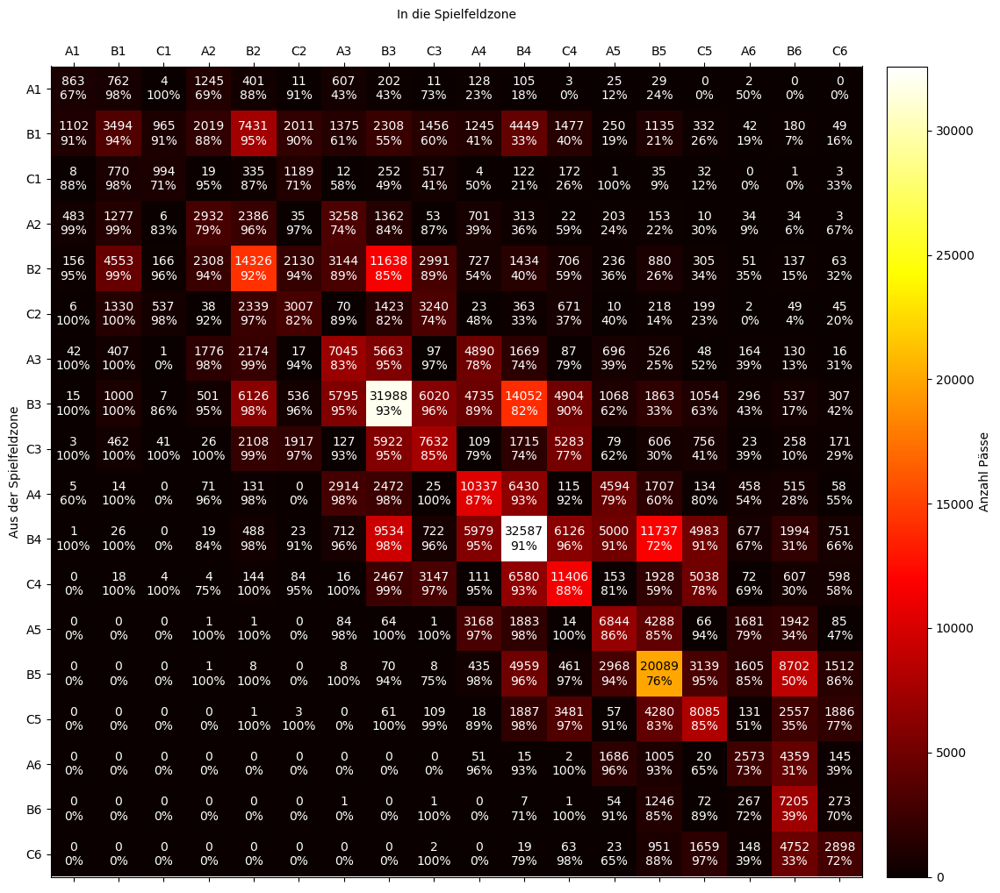

In [375]:
plt.style.use('default')
fig = plt.figure(figsize=(24,12))
ax = fig.add_subplot(111)
cax = ax.matshow(passes_matrix, cmap='hot')
for (i, j), z in np.ndenumerate(passes_matrix):
    text_color = 'white'
    if z >= np.max(passes_matrix).max() * 0.6:
        text_color = 'black'
    ax.text(j, i, str(z) + '\n' + str(int(np.round(100 * accuracy_matrix[zones[j]][zones[i]]))) + '%', ha='center', va='center', color=text_color)
fig.colorbar(cax, label='Anzahl Pässe', pad=0.015)
ticks = np.arange(0, len(zones), 1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(zones)
ax.set_yticklabels(zones)
ax.set_ylabel('Aus der Spielfeldzone', fontsize=10)
ax.set_title('In die Spielfeldzone', fontsize=10)
plt.show()
plt.style.use('fivethirtyeight')

In [ ]:
# (Spieler-)pässe pro Zone mit Einfärbung der Zone nach Passhäufigkeit und Pfeilen für die durchschnittliche Passrichtung

In [187]:
matches[matches['home_team_name'] == 'Real Madrid']

,match_id,home_team_id,home_team_name,away_team_id,away_team_name,home_score,away_score,competition_name,competition_id,competition_stage,season,match_date
35,9736,220,Real Madrid,217,Barcelona,0,3,La Liga,11,Regular Season,2017/2018,2017-12-23
33,267569,220,Real Madrid,217,Barcelona,2,3,La Liga,11,Regular Season,2016/2017,2017-04-23
15,69259,220,Real Madrid,217,Barcelona,0,2,La Liga,11,Regular Season,2009/2010,2010-04-10
12,69245,220,Real Madrid,217,Barcelona,1,1,La Liga,11,Regular Season,2010/2011,2011-04-16
21,69334,220,Real Madrid,217,Barcelona,1,3,La Liga,11,Regular Season,2011/2012,2011-12-10
8,70272,220,Real Madrid,217,Barcelona,2,1,La Liga,11,Regular Season,2012/2013,2013-03-02
24,265857,220,Real Madrid,217,Barcelona,3,4,La Liga,11,Regular Season,2013/2014,2014-03-23
14,267085,220,Real Madrid,217,Barcelona,3,1,La Liga,11,Regular Season,2014/2015,2014-10-25
26,266424,220,Real Madrid,217,Barcelona,0,4,La Liga,11,Regular Season,2015/2016,2015-11-21
13,68319,220,Real Madrid,217,Barcelona,0,3,La Liga,11,Regular Season,2005/2006,2005-11-19


In [250]:
def get_coords_of_zone_center(zone):
    zone1 = zone[0]
    zone2 = zone[1]
    if zone1 == 'A':
        x = 9
    if zone1 == 'B':
        x = 40
    if zone1 == 'C':
        x = 71
    if zone2 == '1':
        y = 8
    if zone2 == '2':
        y = 27
    if zone2 == '3':
        y = 48
    if zone2 == '4':
        y = 69
    if zone2 == '5':
        y = 90
    if zone2 == '6':
        y = 110
    return (x,y)

In [620]:
def plot_passes_between_zones(match_id, home_team=True, min_passes=7):
    match = pd.Series(matches[matches['match_id'] == match_id].iloc[0])
    match_passes = passes[passes['match_id'] == match['match_id']]
    if home_team:
        team_name = match['home_team_name']
        team_passes = match_passes[match_passes['team_id'] == match['home_team_id']]
    else:
        team_name = match['away_team_name']
        team_passes = match_passes[match_passes['team_id'] == match['away_team_id']]

    df_team_passes = pd.DataFrame()
    df_team_passes['zone_pairs'] = team_passes.apply(lambda x: '_'.join(sorted([x['from_zone'], x['to_zone']])), axis=1)
    team_zone_pairs = df_team_passes.groupby('zone_pairs').size().to_frame('num_passes')

    pitch = Pitch(figsize=(11,11), pitch_color='grass', line_color='white', stripe=True, axis=True, 
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    ax.vlines(18,0,120, linestyle='--', linewidth=2)
    ax.vlines(62,0,120, linestyle='--', linewidth=2)
    ax.hlines(18,0,80, linestyle='--', linewidth=2)
    ax.hlines(39,0,80, linestyle='--', linewidth=2)
    ax.hlines(60,0,80, linestyle='--', linewidth=2)
    ax.hlines(81,0,80, linestyle='--', linewidth=2)
    ax.hlines(102,0,80, linestyle='--', linewidth=2)
    ax.text(8,-3.3,'A',fontsize=16)
    ax.text(39,-3.3,'B',fontsize=16)
    ax.text(70,-3.3,'C',fontsize=16)
    ax.text(-3,8,'1',fontsize=16)
    ax.text(-3,27,'2',fontsize=16)
    ax.text(-3,48,'3',fontsize=16)
    ax.text(-3,69,'4',fontsize=16)
    ax.text(-3,90,'5',fontsize=16)
    ax.text(-3,110,'6',fontsize=16)
    for idx, row in team_zone_pairs[team_zone_pairs['num_passes'] >= min_passes].iterrows():
        from_zone = idx.split('_')[0]
        to_zone = idx.split('_')[1]
        if from_zone != to_zone:
            x1, y1 = get_coords_of_zone_center(from_zone)
            x2, y2 = get_coords_of_zone_center(to_zone)
            pitch.arrows(y1, x1, y2, x2, ax=ax, color='black', width=row['num_passes']/3)
    plt.title('Häufigste Pässe zwischen den Spielfeldzonen von ' + team_name + '\n' +
              match['home_team_name'] + ' ' + str(match['home_score']) + ':' + 
              str(match['away_score']) + ' ' + match['away_team_name'], fontsize=14)
    plt.show()

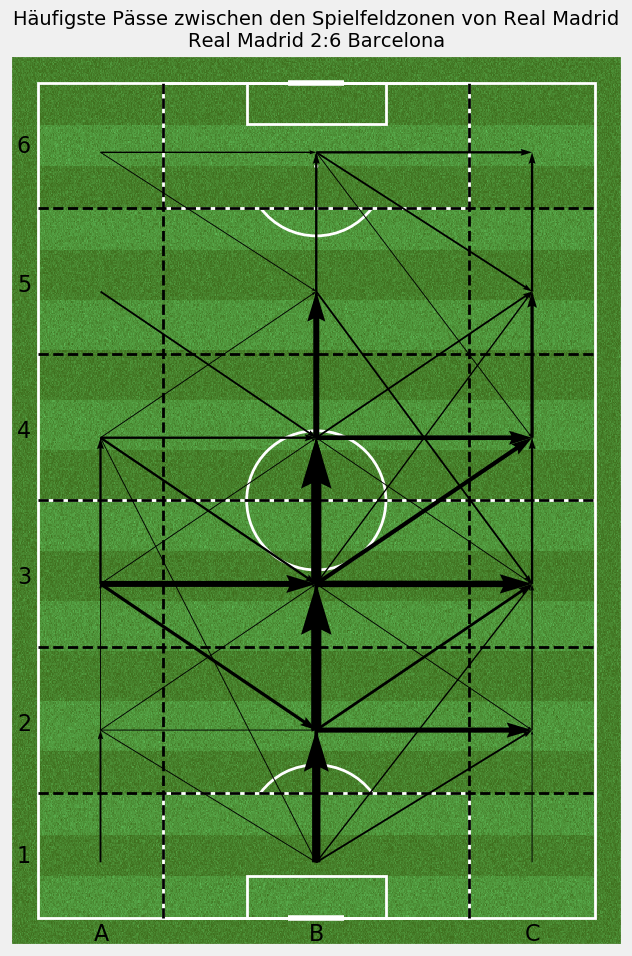

In [621]:
plot_passes_between_zones(69249, home_team=True, min_passes=2)

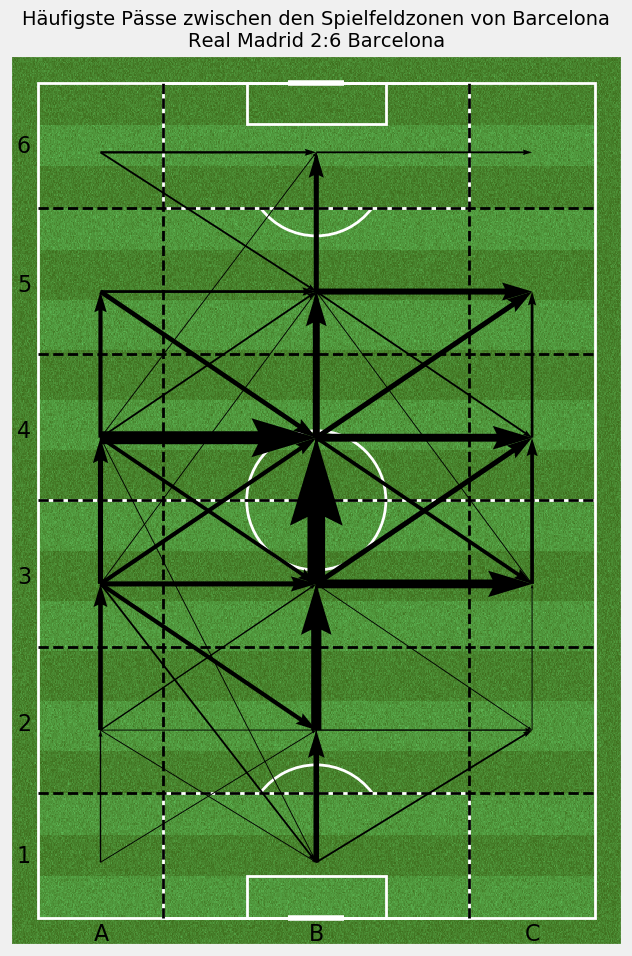

In [622]:
plot_passes_between_zones(69249, home_team=False, min_passes=2)

In [5]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

In [13]:
def plot_passes_between_players(match_id, home_team=True, min_passes=7):
    match = pd.Series(matches[matches['match_id'] == match_id].iloc[0])
    match_passes = passes[passes['match_id'] == match['match_id']]
    if home_team:
        team_name = match['home_team_name']
        team_passes = match_passes[match_passes['team_id'] == match['home_team_id']]
    else:
        team_name = match['away_team_name']
        team_passes = match_passes[match_passes['team_id'] == match['away_team_id']]
    team_passes.reset_index(inplace=True, drop=True)
    
    # remove all passes after the first substituition of the team
    players = []
    for idx, row in team_passes.iterrows():
        players.append(row['player_id'])
        if row['recipient'] != -1:
            players.append(row['recipient'])
        if len(np.unique(players)) > 11:
            team_passes = team_passes[:idx]
            break
    
    df_team_passes = pd.DataFrame()
    df_team_passes['player_pairs'] = team_passes.apply(lambda x: '_'.join(sorted([str(x['player_id']), str(x['recipient'])])), axis=1)
    df_team_passes[['location_x', 'location_y', 'end_location_x', 'end_location_y']] = team_passes[['location_x', 'location_y', 'end_location_x', 'end_location_y']]
    team_player_pairs = df_team_passes.groupby('player_pairs').size().to_frame('num_passes')
    for pair in team_player_pairs.index:
        loc_x, loc_y, end_loc_x, end_loc_y = np.mean(df_team_passes.loc[df_team_passes['player_pairs'] == pair, ['location_x', 'location_y', 'end_location_x', 'end_location_y']])
        team_player_pairs.loc[pair, 'location_x'] = loc_x
        team_player_pairs.loc[pair, 'location_y'] = loc_y
        team_player_pairs.loc[pair, 'end_location_x'] = end_loc_x
        team_player_pairs.loc[pair, 'end_location_y'] = end_loc_y
    team_player_pairs.loc[:, 'player'] = [int(float(team_player_pairs.index[i].split('_')[0])) for i in range(len(team_player_pairs))]
    team_player_pairs.loc[:, 'recipient'] = [int(float(team_player_pairs.index[i].split('_')[1])) for i in range(len(team_player_pairs))]
    team_player_pairs = team_player_pairs[(team_player_pairs['player'] != -1) & (team_player_pairs['recipient'] != -1)]
    team_player_pairs = team_player_pairs[team_player_pairs['num_passes'] >= min_passes]
    
    pitch = Pitch(figsize=(11,11), pitch_color='grass', line_color='white', stripe=False, axis=True, 
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    patches = []
    for player in np.unique(team_player_pairs[['player', 'recipient']]):
        locs = pd.concat([team_player_pairs.loc[team_player_pairs['player'] == player, ['location_y', 'location_x']], 
                          team_player_pairs.loc[team_player_pairs['recipient'] == player, ['end_location_y', 'end_location_x']].rename(columns={'end_location_y': 'location_y', 'end_location_x': 'location_x'})])
        polygon = Polygon(locs, True)
        patches.append(polygon)
        loc_x, loc_y = np.mean(locs)
        player_name = get_player_name(player)
        if len(player_name.split(' ')) > 1:
            player_name = ' '.join(player_name.split(' ')[1:])
        plt.text(loc_x-len(player_name), loc_y, player_name, fontsize=13, color='white', zorder=2)
    p = PatchCollection(patches, cmap=plt.cm.jet, alpha=0.5)
    colors = 100*np.random.random(len(patches))
    p.set_array(np.array(colors))
    ax.add_collection(p)
    for idx, row in team_player_pairs.iterrows():
        from_player = idx.split('_')[0]
        to_player = idx.split('_')[1]
        pitch.arrows(row['location_x'], row['location_y'], row['end_location_x'], row['end_location_y'], ax=ax, color='black', width=row['num_passes']/3, zorder=1)
    plt.title('Häufigste Pässe zwischen den Spielern von ' + team_name + '\n' +
              match['home_team_name'] + ' ' + str(match['home_score']) + ':' + 
              str(match['away_score']) + ' ' + match['away_team_name'], fontsize=14)
    plt.show()

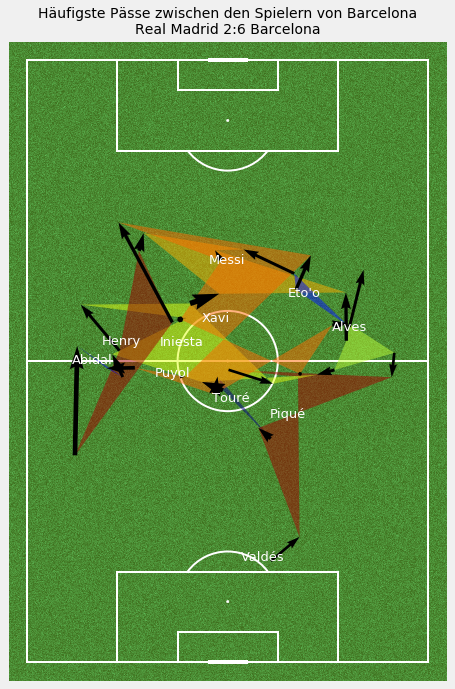

In [14]:
plot_passes_between_players(69249, home_team=False, min_passes=8)

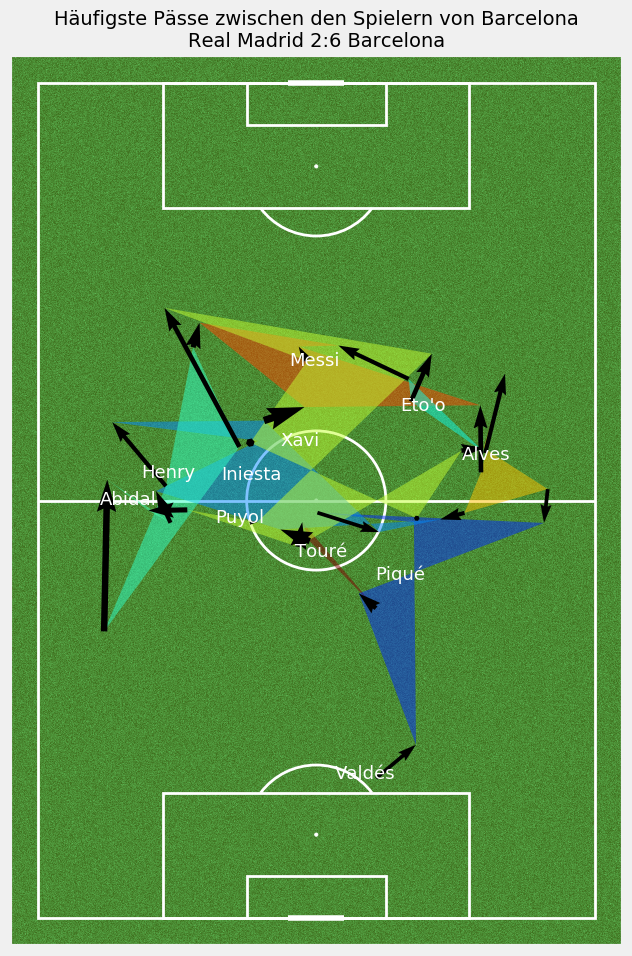

In [665]:
plot_passes_between_players(69249, home_team=False, min_passes=8)

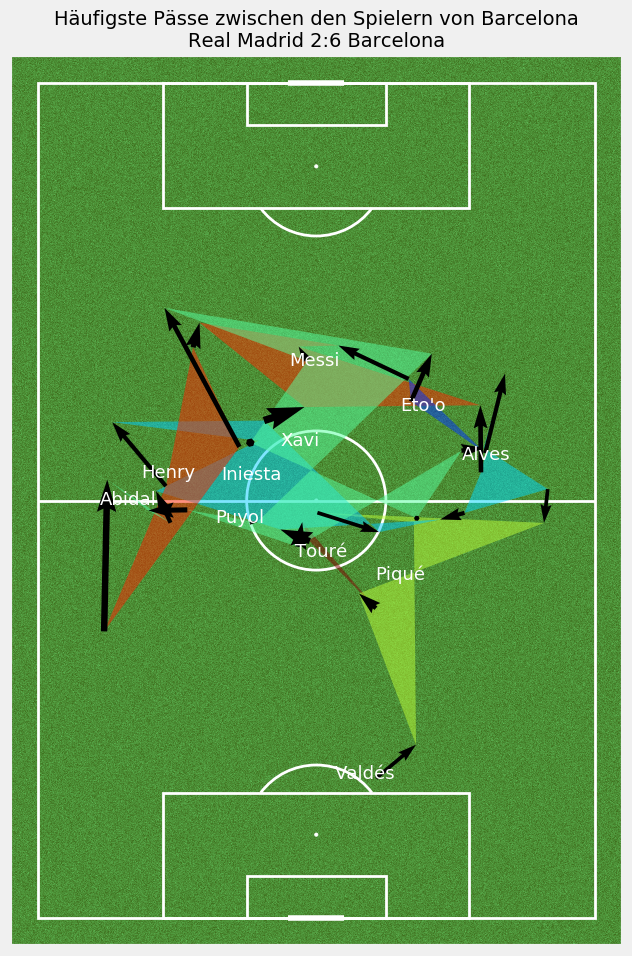

In [667]:
plot_passes_between_players(69249, home_team=False, min_passes=8)

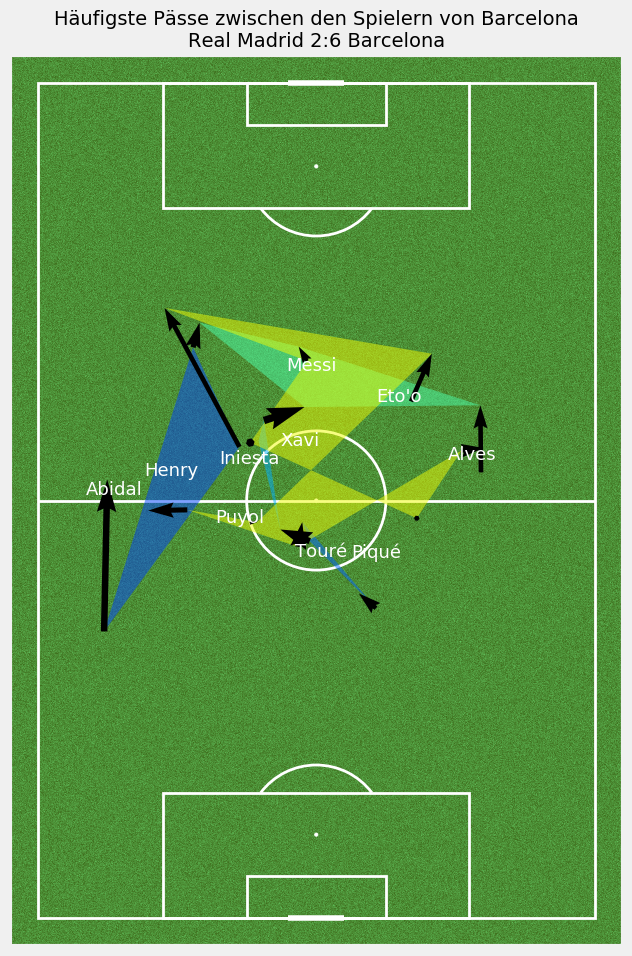

In [673]:
plot_passes_between_players(69249, home_team=False, min_passes=10)